## Loading the data

In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
sc.set_figure_params(dpi=100, frameon=False)
sc.logging.print_header()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.19.2 scipy==1.6.1 pandas==1.2.3 scikit-learn==0.23.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3


In [2]:
%load_ext autoreload
%autoreload 2

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [3]:
import os
os.chdir('./../')

In [4]:
adata = sc.read('datasets/sciplex3_old_reproduced.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 290888 × 5000
    obs: 'cell_type', 'dose', 'dose_character', 'dose_pattern', 'g1s_score', 'g2m_score', 'pathway', 'pathway_level_1', 'pathway_level_2', 'product_dose', 'product_name', 'proliferation_index', 'replicate', 'size_factor', 'target', 'vehicle', 'pert_iname', 'cond_new', 'dose_new', 'name_in_lincs', 'split', 'control', 'n_counts', 'condition', 'dose_val', 'drug_dose_name', 'cov_drug_dose_name', 'old_split', 'split_all', 'ct_dose', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25', 'split26', 'split27', 'split28', 'cov_drug'
    var: 'id', 'num_cells_expressed-0-0', 'num_cells_expressed-1-0', 'num_cells_expressed-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov', 'splits'

## Look at data

In [6]:
import pandas as pd
pd.crosstab(adata.obs['split'], adata.obs['condition'])

condition,2-Methoxyestradiol,A-366,ABT-737,AC480,AG-490,AG-14361,AICAR,AMG-900,AR-42,AT9283,...,Valproic,Vandetanib,Veliparib,WHI-P154,WP1066,XAV-939,ZM,Zileuton,control,nan
split,,,,,,,,,,,,,,,,,,,,,
ood,0,0,0,0,0,355,0,0,0,0,...,0,0,0,0,0,249,0,403,0,0
test,146,174,137,180,158,129,183,145,135,101,...,182,137,166,176,197,120,136,128,648,275
train,1341,1507,1257,1475,1590,1170,1640,1191,1271,809,...,1622,1230,1431,1588,1654,1057,1258,1197,5816,2561


## Loading the model

In [7]:
import torch
from compert.train import prepare_compert

state, args, history = torch.load(
    'pretrained_models/sweep_sciplex3_old_reproduced_logsigm_model_seed=30_epoch=340.pt',
    map_location=torch.device('cpu'))

# load the dataset and model pre-trained weights
model, datasets = prepare_compert(args, state_dict=state)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [8]:
args

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'dataset_path': 'datasets/sciplex3_old_reproduced.h5ad',
 'perturbation_key': 'condition',
 'dose_key': 'dose_val',
 'cell_type_key': 'cell_type',
 'split_key': 'split',
 'loss_ae': 'gauss',
 'doser_type': 'logsigm',
 'decoder_activation': 'linear',
 'seed': 30,
 'hparams': '',
 'max_epochs': 2000,
 'max_minutes': 3000,
 'patience': 20,
 'checkpoint_freq': 20,
 'save_dir': '/checkpoint/dlp/sweep_sciplex3_old_reproduced_logsigm',
 'sweep_seeds': 200}

In [9]:
model.hparams  # current model

{'dim': 256,
 'dosers_width': 64,
 'dosers_depth': 2,
 'dosers_lr': 0.00027322083000748615,
 'dosers_wd': 1.6901978814494262e-07,
 'autoencoder_width': 1024,
 'autoencoder_depth': 4,
 'adversary_width': 128,
 'adversary_depth': 4,
 'reg_adversary': 92.68382940512102,
 'penalty_adversary': 0.05071935089473691,
 'autoencoder_lr': 0.0014838449980044868,
 'adversary_lr': 6.506990958061247e-05,
 'autoencoder_wd': 3.507012291996189e-08,
 'adversary_wd': 4.289521637980284e-05,
 'adversary_steps': 5,
 'batch_size': 256,
 'step_size_lr': 15}

In [10]:
from compert.plotting import CompertVisuals
from compert.api import ComPertAPI

In [11]:
compert_api = ComPertAPI(datasets, model)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Evaluate performance

In [12]:
subset = adata[adata.obs[args['cell_type_key']] == 'A549'].copy()
genes_control = subset[subset.obs[args['perturbation_key']] == 'control'].copy()

#### R2 matrix

In [12]:
# construct prediction annadata

df = pd.DataFrame({args['perturbation_key']: adata.obs[args['perturbation_key']].unique()[:20], 
                   args['dose_key']: ['1.0']*20, 
                   args['cell_type_key']: ['A549']*10 + ['MCF7']*10})

pred = compert_api.predict(genes_control.X.toarray(), df, return_anndata=True)  # normally would put `sample=True` here
pred.obs['cov_drug_dose_name'] = \
    pred.obs['cell_type'].astype(str) + '_' + pred.obs['condition'].astype(str) + '_' + pred.obs['dose_val'].astype(str)
pred.obs['cov_drug_dose_name'] = pred.obs['cov_drug_dose_name'].astype('category')
pred

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …


AnnData object with n_obs × n_vars = 33360 × 5000
    obs: 'condition', 'dose_val', 'cell_type', 'uncertainty_cosine', 'uncertainty_euclidean', 'closest_cond_cosine', 'closest_cond_euclidean', 'cov_drug_dose_name'
    layers: 'variance'

Calculate R2 between predicted categories.

In [13]:
de_dict = datasets['training'].de_genes
de_dict = {k: adata.var_names for k, v in de_dict.items()}

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


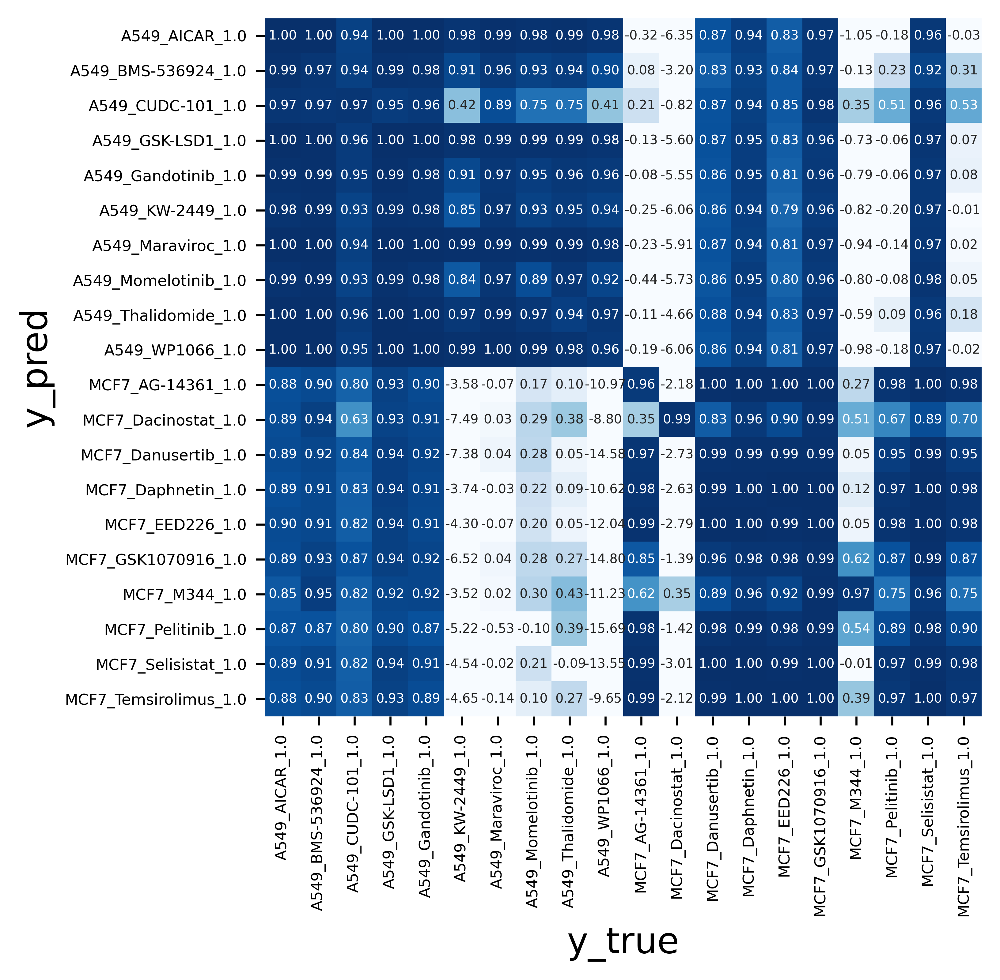

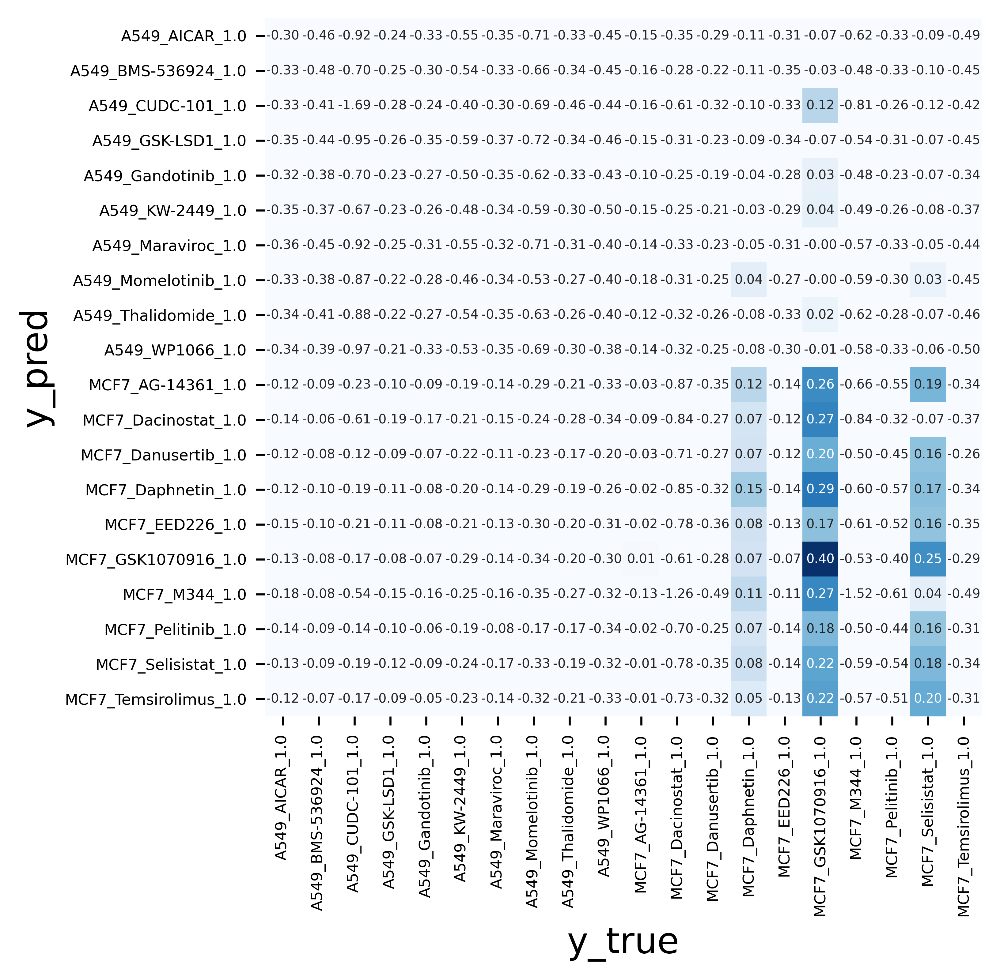

In [14]:
from compert.plotting import plot_r2_matrix
plot_r2_matrix(pred, adata, datasets['training'].de_genes)

#### On the real data:

In [52]:
adata.X = adata.X.toarray()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


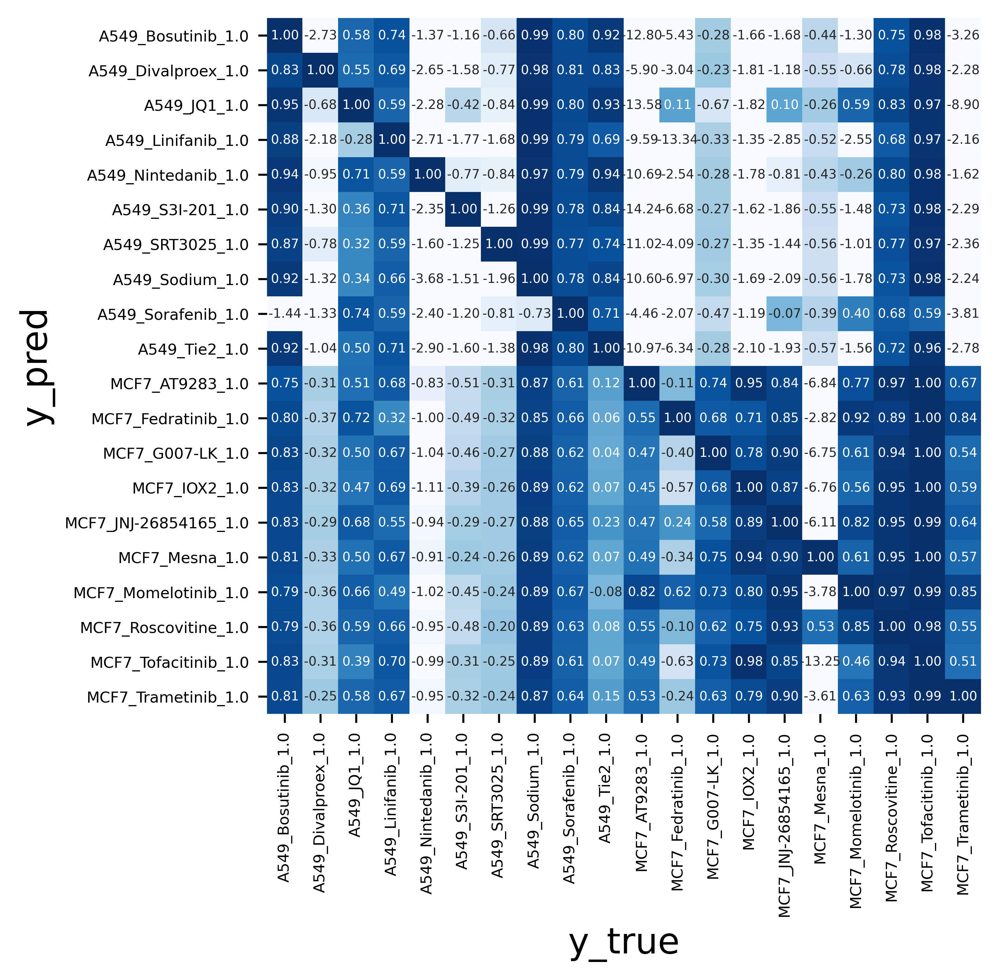

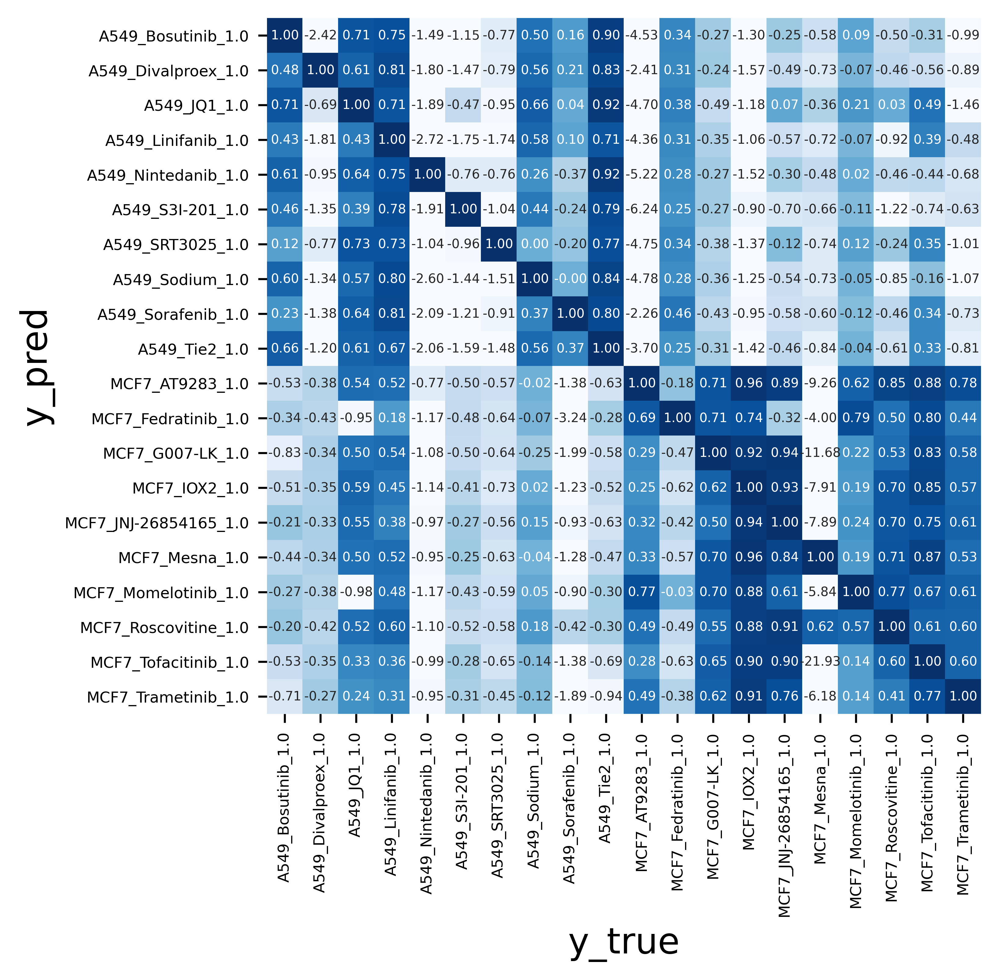

In [54]:
plot_r2_matrix(
    adata[adata.obs.cov_drug_dose_name.isin(pred.obs.cov_drug_dose_name.unique())],
    adata, datasets['training'].de_genes)

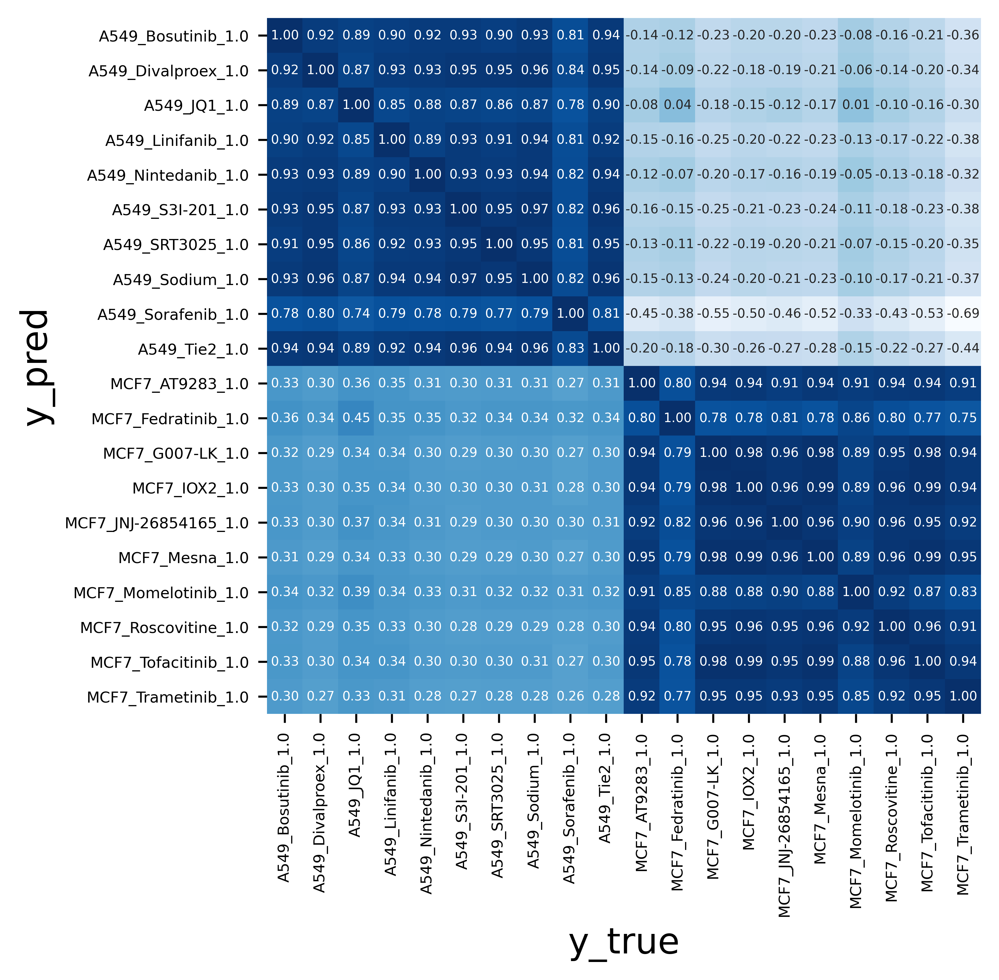

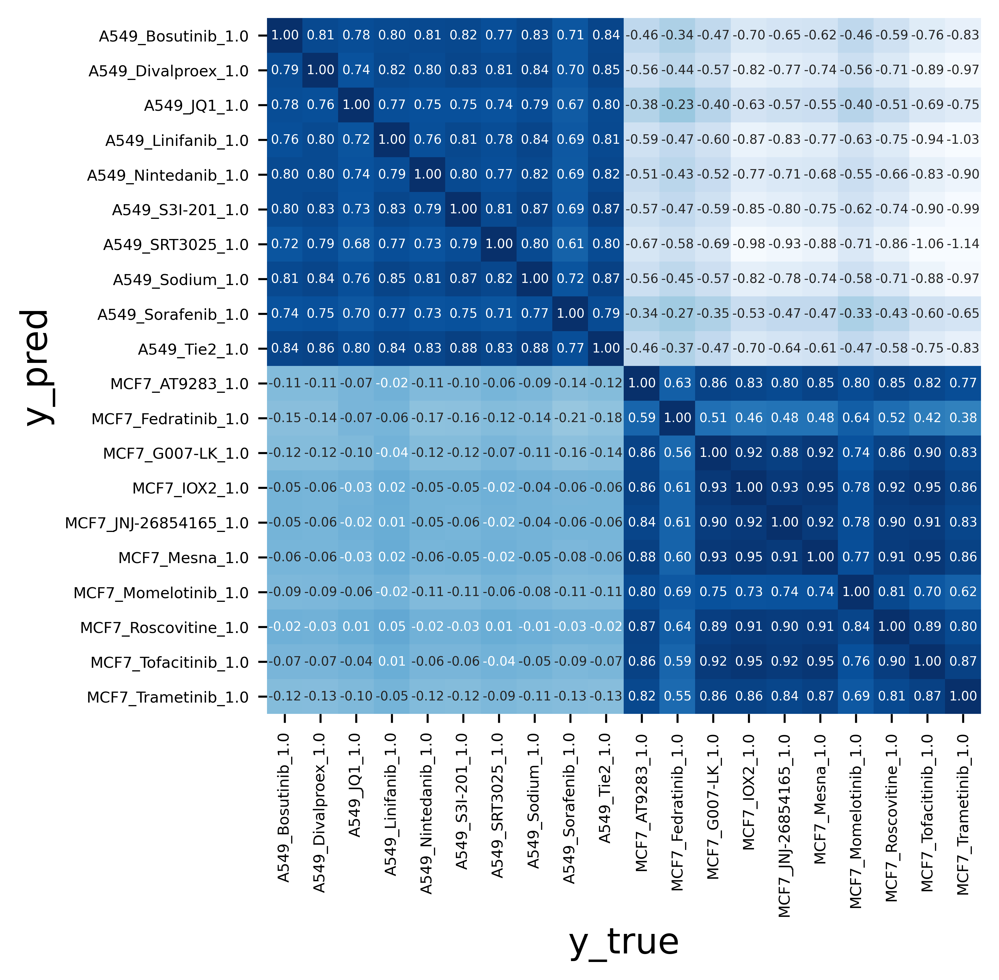

In [53]:
plot_r2_matrix(
    adata[adata.obs.cov_drug_dose_name.isin(pred.obs.cov_drug_dose_name.unique())],
    adata, de_dict)

We should see a strong diagonal in a good model.

#### Plot example condition

Not OOD:

In [95]:
%%time
df = pd.DataFrame({args['perturbation_key']: ['Trametinib']*3, 
                   args['dose_key']: ['1.0']*3, 
                   args['cell_type_key']: ['A549', 'MCF7', 'K562']})

pred = compert_api.predict(genes_control.X.toarray(), df, return_anndata=True, sample=True)

pred_adata = pred.concatenate(
    [adata[adata.obs.condition == 'Trametinib'], adata[adata.obs.condition == 'control']],
    batch_key='source', batch_categories=['pred', 'true', 'ctrl'])

Careful! These are sampled values! Better use means and                 variances for dowstream tasks!


AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


CPU times: user 1min 32s, sys: 1.97 s, total: 1min 34s
Wall time: 4.68 s


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
... storing 'condition' as categorical
... storing 'dose_val' as categorical
... storing 'cell_type' as categorical
... storing 'closest_cond_cosine' as categorical
... storing 'closest_cond_euclidean' as categorical
... storing 'dose_character' as categorical
... storing 'dose_pattern' as categorical
... storing 'pathway' as categorical
... storing 'pathway_level_1' as categorical
... storing 'pathway_level_2' as categorical
... storing 'product_dose' as categorical
... storing 'product_name' as categorical
... storing 'replicate' as categorical
... storing 'target' as categorical
... storing 'pert_iname' as c

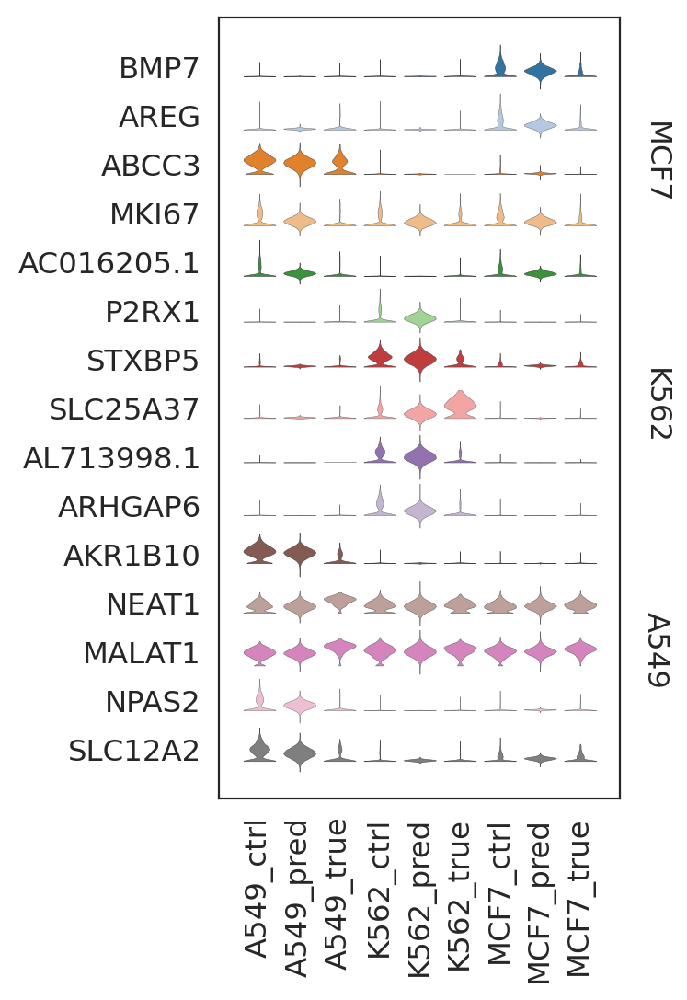

In [96]:
sc.pl.stacked_violin(
    pred_adata,
    var_names={
        'MCF7': datasets['training'].de_genes['MCF7_Trametinib_1.0'][:5],
        'K562': datasets['training'].de_genes['K562_Trametinib_1.0'][:5],
        'A549': datasets['training'].de_genes['A549_Trametinib_1.0'][:5]
    },
    groupby=['cell_type', 'source'],
    row_palette='tab20', swap_axes=True)
#     title='real vs. pred for Trametinib at highest dose')

OOD:

Careful! These are sampled values! Better use means and                 variances for dowstream tasks!


AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
... storing 'condition' as categorical
... storing 'dose_val' as categorical
... storing 'cell_type' as categorical
... storing 'closest_cond_cosine' as categorical
... storing 'closest_cond_euclidean' as categorical
... storing 'dose_character' as categorical
... storing 'dose_pattern' as categorical
... storing 'pathway' as categorical
... storing 'pathway_level_1' as categorical
... storing 'pathway_level_2' as categorical
... storing 'product_dose' as categorical
... storing 'product_name' as categorical
... storing 'replicate' as categorical
... storing 'target' as categorical
... storing 'pert_iname' as categorical
.

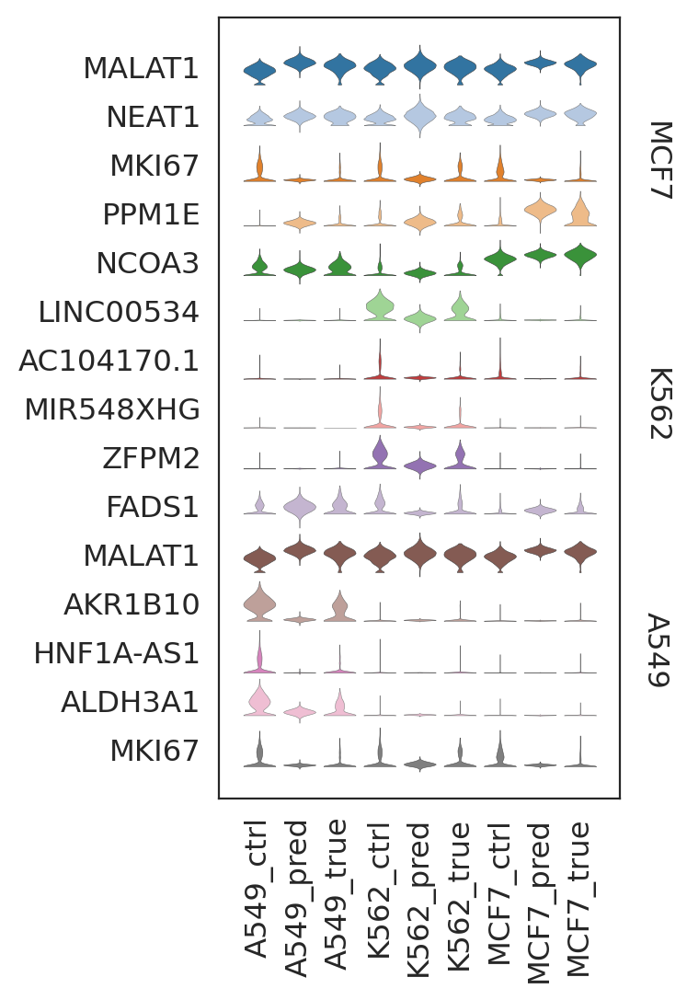

CPU times: user 1min 51s, sys: 2.51 s, total: 1min 53s
Wall time: 9.92 s


In [105]:
%%time
df = pd.DataFrame({args['perturbation_key']: ['Pracinostat']*3, 
                   args['dose_key']: ['1.0']*3, 
                   args['cell_type_key']: ['A549', 'MCF7', 'K562']})

pred = compert_api.predict(genes_control.X.toarray(), df, return_anndata=True, sample=True)

pred_adata = pred.concatenate(
    [adata[adata.obs.condition == 'Pracinostat'], adata[adata.obs.condition == 'control']],
    batch_key='source', batch_categories=['pred', 'true', 'ctrl'])

sc.pl.stacked_violin(
    pred_adata,
    var_names={
        'MCF7': datasets['training'].de_genes['MCF7_Pracinostat_1.0'][:5],
        'K562': datasets['training'].de_genes['K562_Pracinostat_1.0'][:5],
        'A549': datasets['training'].de_genes['A549_Pracinostat_1.0'][:5]
    },
    groupby=['cell_type', 'source'],
    row_palette='tab20', swap_axes=True)
#     title='real vs. pred for Trametinib at highest dose')

#### Plot OOD

In [13]:
from compert.plotting import mean_plot

In [42]:
random_cmpds = ['Carmofur', 'Crizotinib', 'Momelotinib', 'Fulvestrant']

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [35]:
df = adata[adata.obs.split == 'ood'].obs[['condition', 'dose_val', 'cell_type']]
df = df[df.condition.isin(random_cmpds)]
df = df.drop_duplicates()
df = df.reset_index(drop=True)

In [36]:
%%time
pred = compert_api.predict(genes_control.X.toarray(),
    df[df.condition.isin(random_cmpds)],  # random selection
    return_anndata=True)
pred.obs['cov_drug_dose_name'] = \
    pred.obs['cell_type'].astype(str) + '_' + pred.obs['condition'].astype(str) + '_' + pred.obs['dose_val'].astype(str)

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …


CPU times: user 3min 20s, sys: 4.94 s, total: 3min 25s
Wall time: 4.8 s


In [38]:
%%time
pred_adata = pred.concatenate(
    adata[adata.obs.split == 'ood'],
    batch_key='source', batch_categories=['pred', 'true'])

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


CPU times: user 3.13 s, sys: 1.12 s, total: 4.26 s
Wall time: 4.27 s


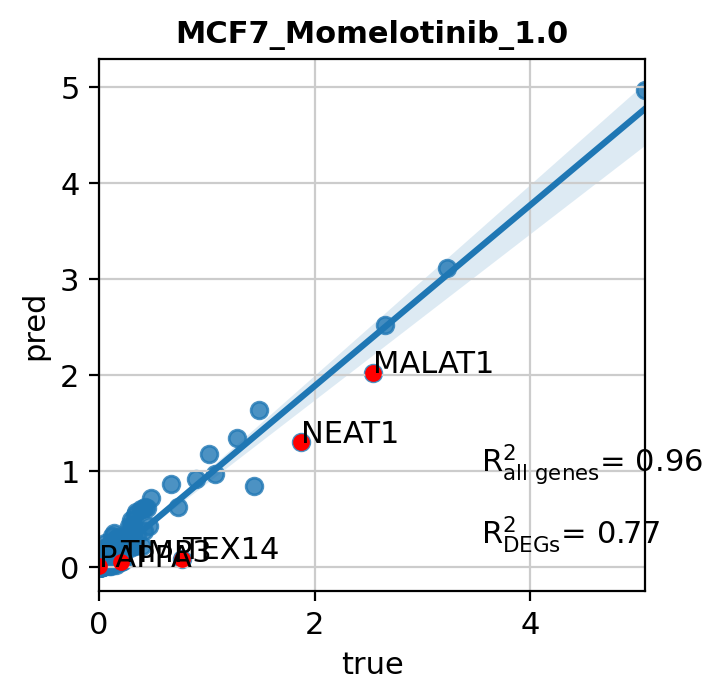

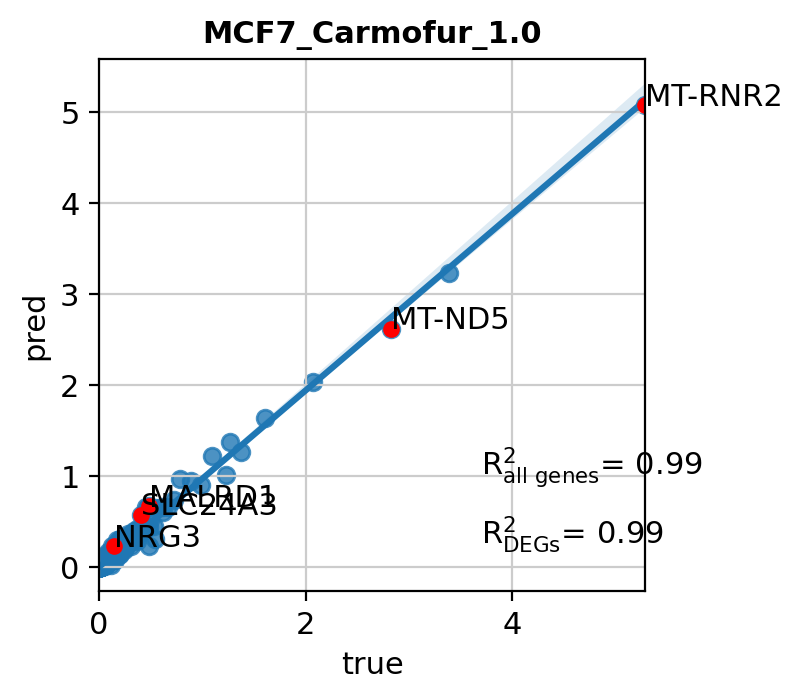

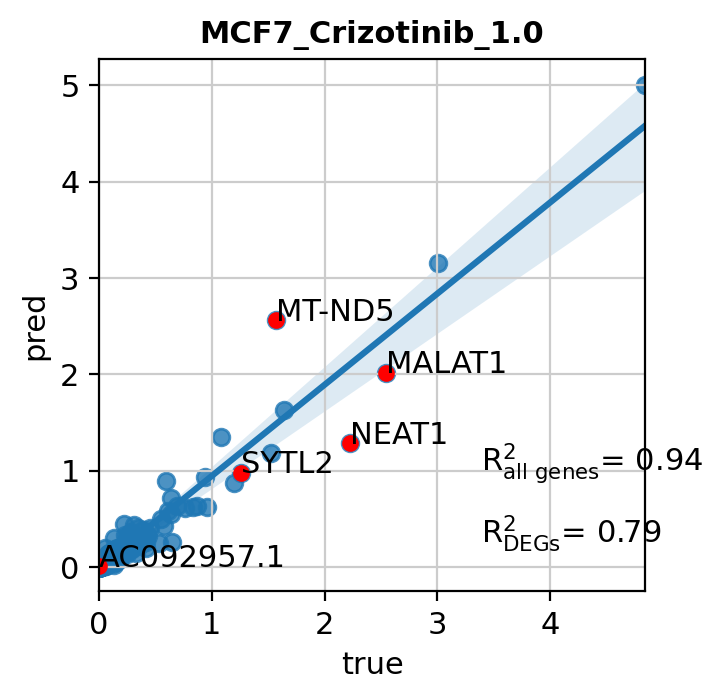

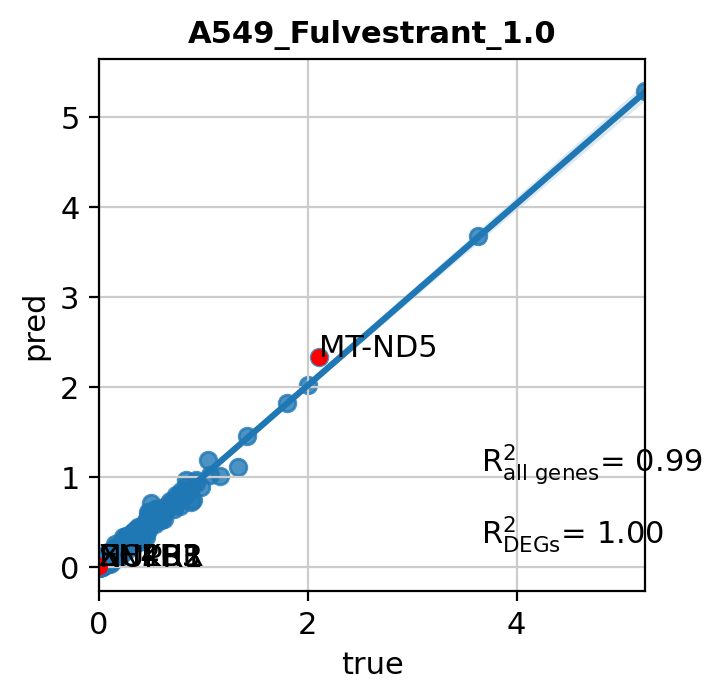

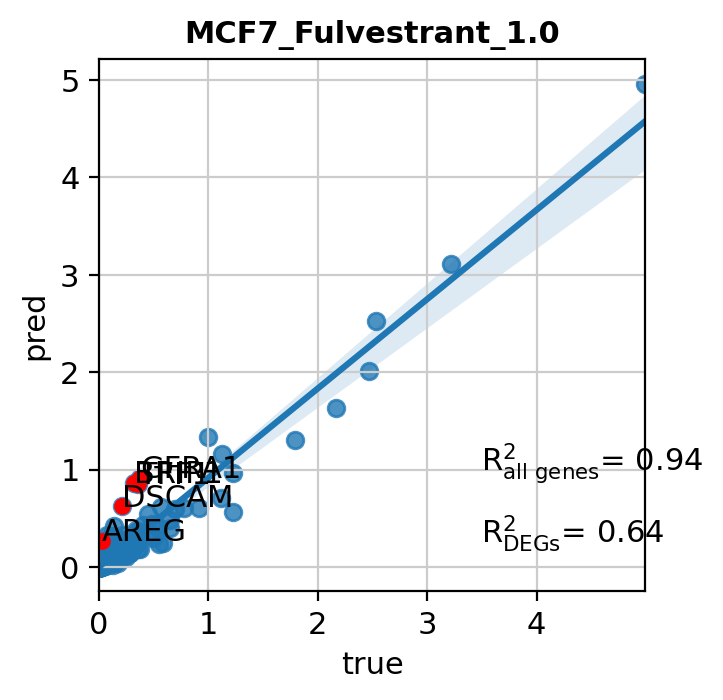

...

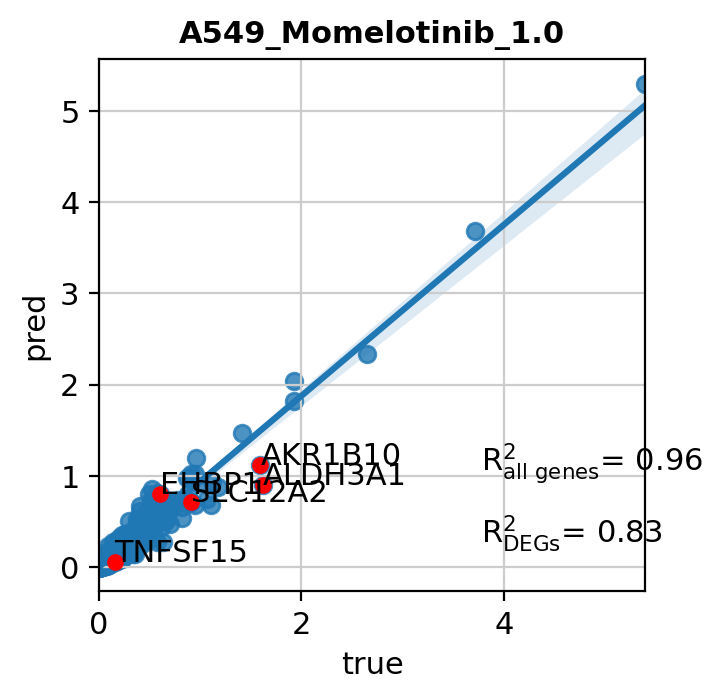

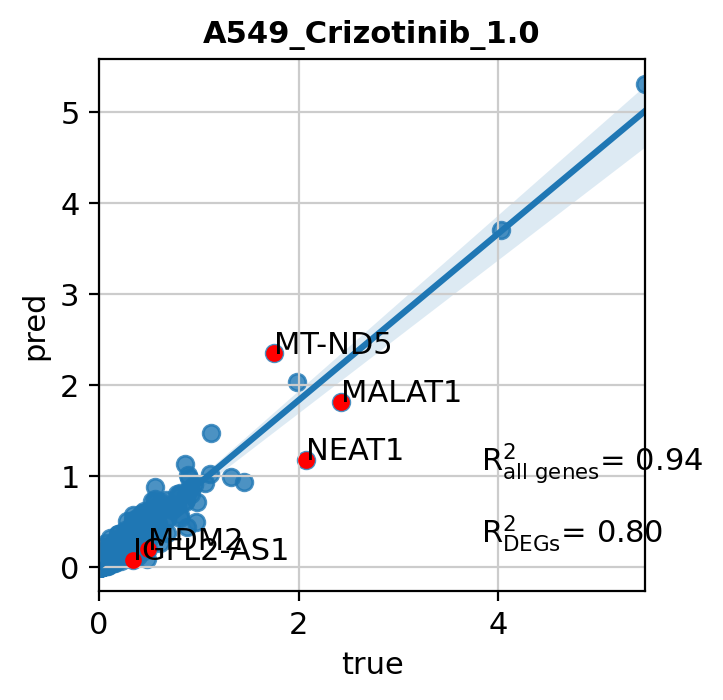

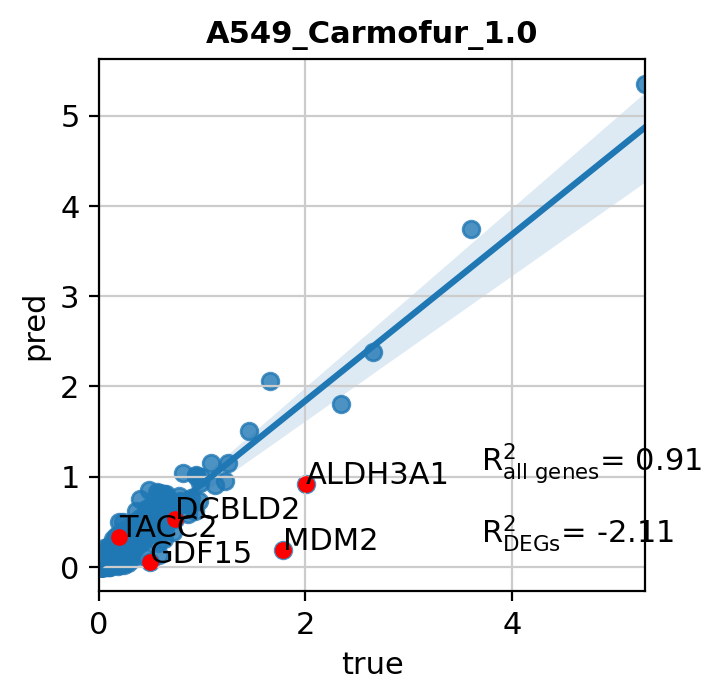

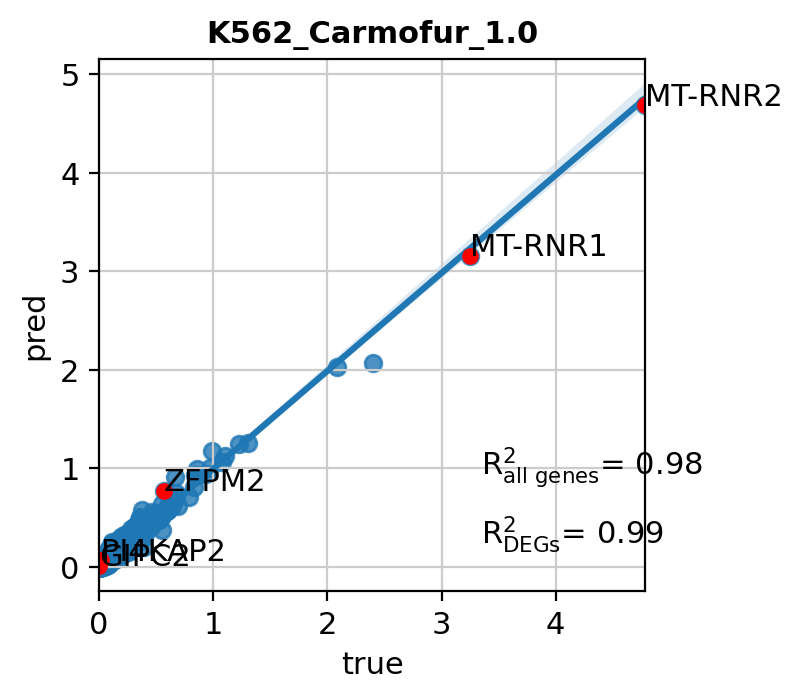

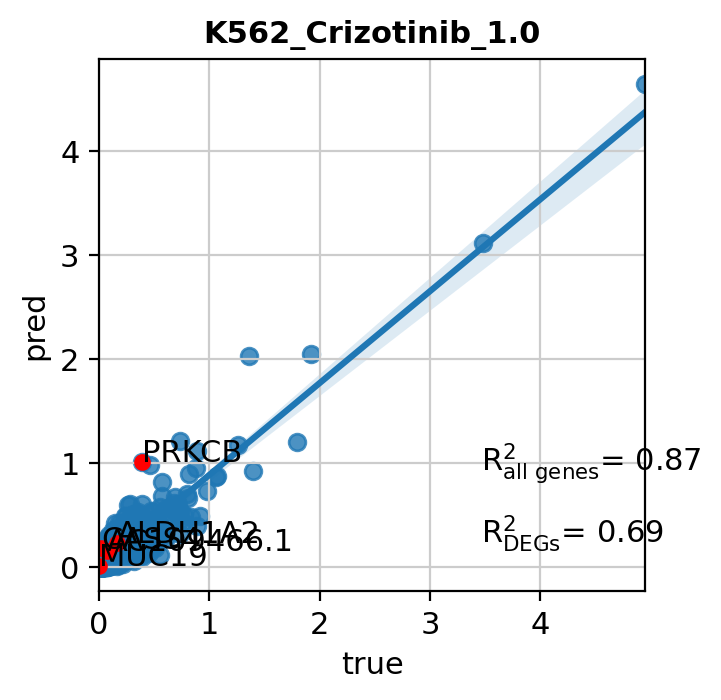

In [41]:
for cond in pred.obs.cov_drug_dose_name.unique():
    mean_plot(
        pred,
        adata,
        'cov_drug_dose_name',
        cond,
        deg_list=datasets['training'].de_genes[cond],
        gene_list=datasets['training'].de_genes[cond][:5],
        show=True, title=cond)

TODO: get OOD summary

In [ ]:
# sc.pl.stacked_violin(
#     pred_adata,
#     var_names=datasets['training'].de_genes['MCF7_Trametinib_1.0'][:10],
#     groupby=['cell_type', 'source'],
#     row_palette='tab20', swap_axes=True)

## Plotting learned embeddings

In [17]:
sc.set_figure_params(dpi=300, frameon=False)

Currently we need to provide the whole dataset to initialize the API. Parameter 'return_dataset=True' in load_dataset_splits() will return this full dataset in the correct format.

Print and plot drug embeddings.

In [18]:
covars_anndata = compert_api.get_covars_embeddings()
perts_anndata = compert_api.get_drug_embeddings()
perts_anndata.obs['MoA'] = perts_anndata.obs.condition.map(
    dict(zip(adata.obs.condition.values, adata.obs.pathway_level_1.values))
)
latent_response = compert_api.latent_dose_response()

In [19]:
# multiply by per compound dose response
for cond in perts_anndata.obs.condition.unique():
    perts_anndata[perts_anndata.obs.condition == cond].X *= latent_response[(latent_response.condition == 'Barasertib') & (latent_response.dose_val == 1.0)].response.values[0]

In [20]:
# ct_adatas = []
# for i in range(3):
#     perts_ct = perts_anndata.copy()

#     perts_ct.X = perts_ct.X + covars_anndata.X[i]
#     ct_adatas.append(perts_ct)

#     sc.tl.pca(perts_ct)
#     sc.pp.neighbors(perts_ct, n_neighbors=6, metric='cosine', n_pcs=4)
#     sc.tl.umap(perts_ct)

#     sc.pl.umap(perts_ct, color='MoA', size=50)
# #     perts_anndata.uns['MoA_colors'] = perts_ct.uns['MoA_colors'][:-1] + ['#000000']  # make "Vehicle" black
#     # sc.pl.umap(perts_anndata, color='MoA', size=50)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [21]:
# # plot them all on the same UMAP
# all_ct = ct_adatas[0].concatenate(ct_adatas[1:])
# sc.tl.pca(all_ct)
# sc.pp.neighbors(all_ct, n_neighbors=6, metric='cosine', n_pcs=4)
# sc.tl.umap(all_ct)
# sc.pl.umap(all_ct, color='MoA', size=50)

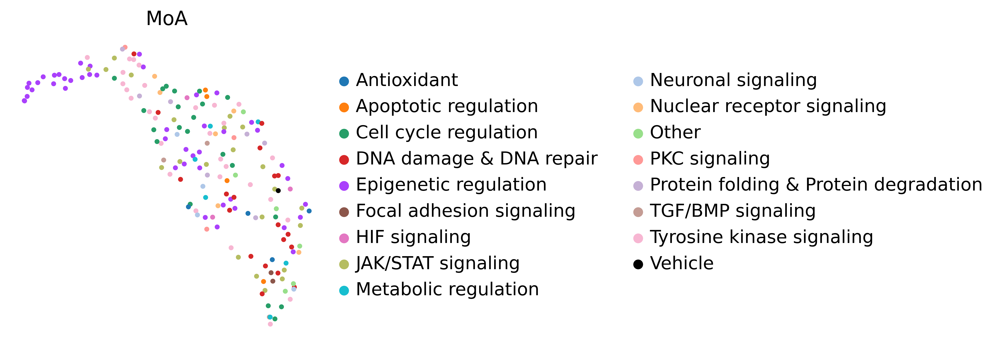

In [24]:
sc.tl.pca(perts_anndata)
sc.pp.neighbors(perts_anndata, n_neighbors=6, n_pcs=4)
sc.tl.umap(perts_anndata)

sc.pl.umap(perts_anndata, color='MoA', size=50)
perts_anndata.uns['MoA_colors'] = perts_anndata.uns['MoA_colors'][:-1] + ['#000000']  # make "Vehicle" black

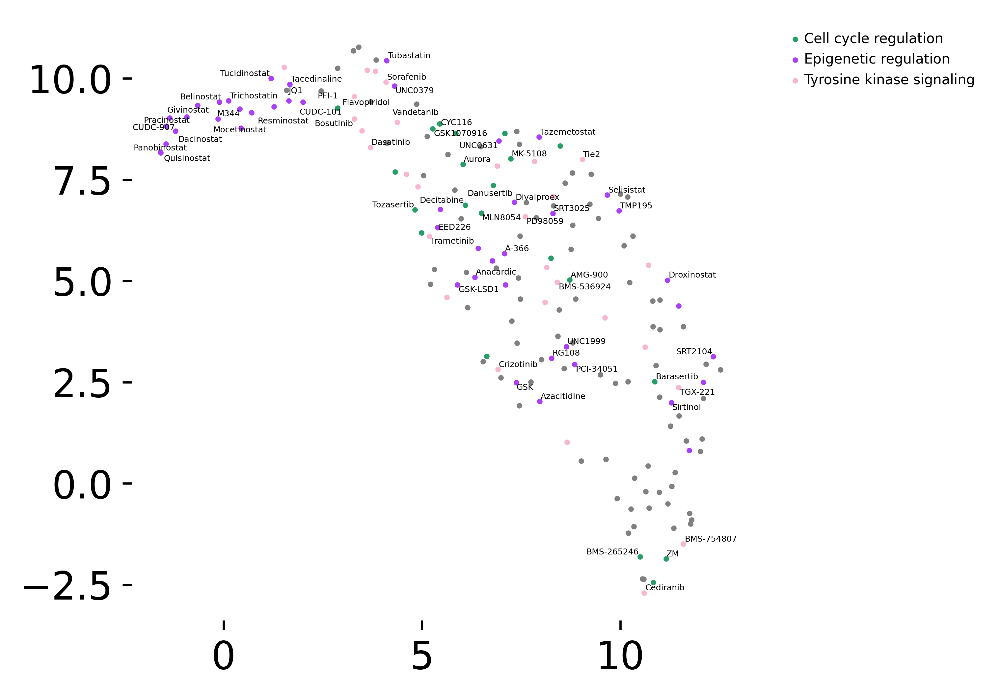

In [26]:
from adjustText import adjust_text

MoAs = ['Epigenetic regulation', 'Tyrosine kinase signaling', 'Cell cycle regulation']
cmpds = [
    'PFI-1', 'Vandetanib', 'AMG-900', 'TGX-221', 'SRT3025', 
    'GSK-LSD1', 'Danusertib', 'MLN8054', 'Tacedinaline', 'Pracinostat', 
    'GSK1070916', 'Barasertib', 'SRT2104', 'Resminostat', 
    'RG108', 'Decitabine', 'BMS-536924', 'Flavopiridol', 
    'Tazemetostat', 'BMS-265246', 'PD98059', 'Cediranib', 
    'Crizotinib', 'Dasatinib', 'Givinostat', 'Tie2', 'PCI-34051', 
    'Tubastatin', 'Quisinostat', 'BMS-754807', 'Divalproex', 
    'Aurora', 'Azacitidine', 'JQ1', 'UNC0379', 'TMP195', 
    'CYC116', 'Droxinostat', 'CUDC-101', 'Trichostatin', 
    'Mocetinostat', 'Bosutinib', 'M344', 'UNC1999', 'Tozasertib', 
    'ZM', 'Sorafenib', 'MK-5108', 'SRT1720', 'UNC0631', 
    'Dacinostat', 'UNC0379', 'Pracinostat', 'Sirtinol', 
    'TMP195', 'GSK', 'PCI-34051', 'Tacedinaline', 'Trametinib', 
    'EED226', 'Tucidinostat', 'CUDC-907', 'Selisistat', 'Anacardic', 
    'Azacitidine', 'Belinostat', 'Tazemetostat', 'SRT3025', 
    'Trichostatin', 'SRT1720', 'Panobinostat', 'UNC0631', 'A-366', 'Divalproex']

# plot colored dots
# perts_anndata = perts_anndata[perts_anndata.obs.MoA.isin(list(set(sciplex.obs.pathway_level_1.unique())))]
for i, moa in enumerate(perts_anndata.obs.MoA.cat.categories):
    subset = perts_anndata[perts_anndata.obs.MoA == moa].copy()
    x = subset.obsm['X_umap'].T[0]
    y = subset.obsm['X_umap'].T[1]
    if moa in MoAs:
        plt.scatter(x, y, label=moa, color=perts_anndata.uns['MoA_colors'][i], s=1, marker='o')
    else:
        plt.scatter(x, y, label='', color='grey', s=1, marker='o')

# plot texts
x = perts_anndata.obsm['X_umap'].T[0]
y = perts_anndata.obsm['X_umap'].T[1]
texts = [plt.text(x[i], y[i], f'{perts_anndata.obs.condition.values[i]}', size=3) for i in range(len(x)) if perts_anndata.obs.condition.values[i] in cmpds]
adjust_text(texts)
plt.grid(b=None)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=5, frameon=False)
# plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='off')
plt.box(False)
plt.show();

Setting up a variabel for automatic plotting. The plots also could be used separately.

In [43]:
compert_plots = CompertVisuals(compert_api, fileprefix=None)

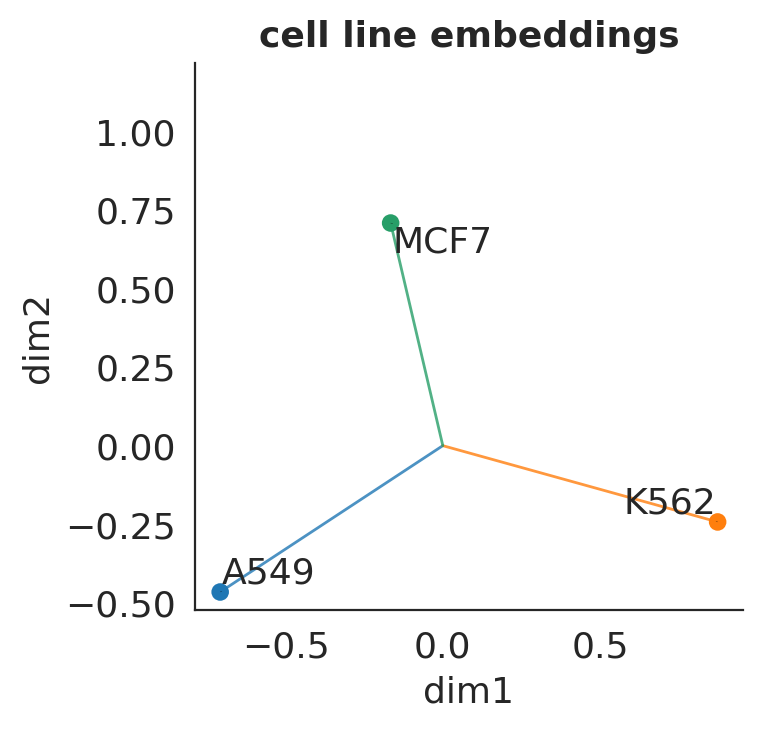

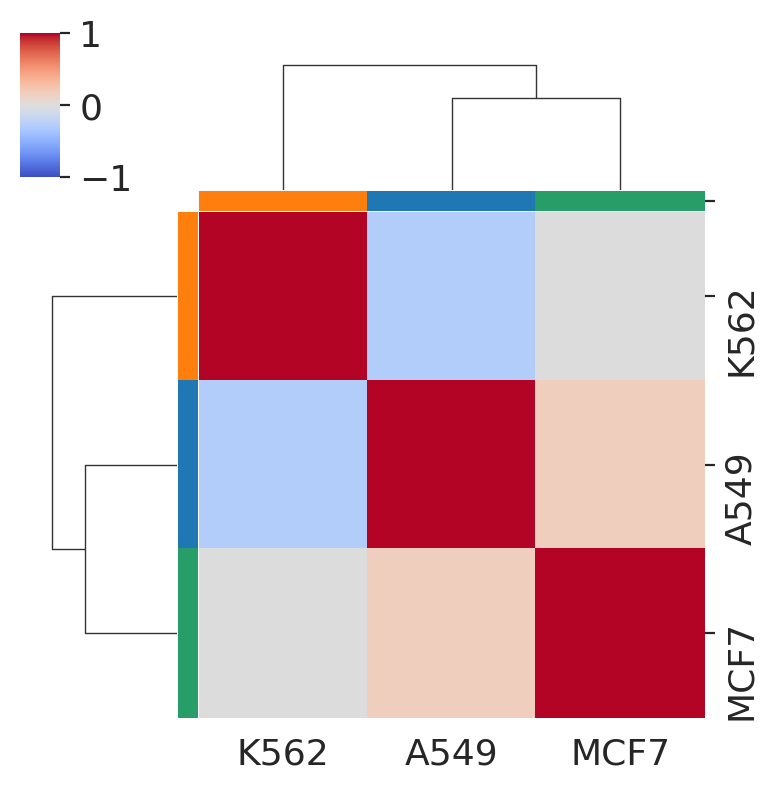

In [52]:
compert_plots.plot_latent_embeddings(compert_api.emb_covars, kind='covariates', labels=compert_api.unique_сovars, titlename='cell line embeddings')

In [38]:
color_dict = dict(zip(
    perts_anndata.obs.condition.values,
    perts_anndata.obs['condition'].map(
        dict(zip(perts_anndata.obs.condition.values, perts_anndata.obs.MoA.values))
    ).map(
        dict(zip(perts_anndata.obs.MoA.cat.categories, perts_anndata.uns['MoA_colors']))
    )
))

In [39]:
latent_response = compert_api.latent_dose_response()
compert_plots.plot_contvar_response(
    latent_response, 
    postfix='latent',
    var_name=compert_api.perturbation_key,
    title_name='Latent dose response',
    palette=color_dict)
plt.legend(bbox_to_anchor=(2.0, 2.0))

/home/icb/yuge.ji/projects/test_AdvAE/compert/plotting.py:602: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()


## Dose response plots

In [53]:
%%time
perts = ['Ofloxacin', 'Dacinostat', 'Fulvestrant', 'Trametinib']  # need to change
df_reference = compert_api.get_response_reference(datasets, perturbations=perts)        
reconstructed_response = compert_api.get_response(datasets, perturbations=perts)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


CPU times: user 2h 1min 15s, sys: 3min, total: 2h 4min 15s
Wall time: 6min 27s


In [54]:
reconstructed_response['source'] = 'pred'
df_reference['source'] = 'true'

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [55]:
import seaborn as sns

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0.5, 1.0, 'real vs. predicted response of Dacinostat in 3 cell lines')

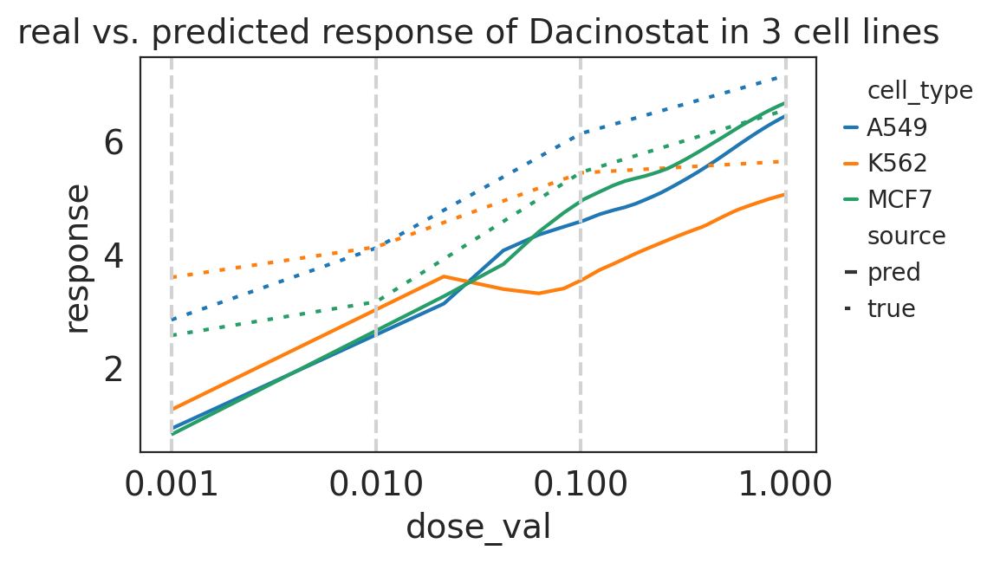

In [76]:
plt.figure(figsize=(5, 3))

data = pd.concat([reconstructed_response, df_reference])
sns.lineplot(
    data=data[data.condition == 'Dacinostat'],
    x='dose_val',
    y='response',
    hue='cell_type', 
    style='source', dashes=[(1, 0), (1.5, 3)])
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=10, frameon=False)

plt.xscale('log')
# floating point x-axis
from matplotlib.ticker import StrMethodFormatter
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.3f}')) # 2 decimal places

# lines for measured time
for val in df_reference.dose_val.unique():
    plt.axvline(val, color='lightgrey', linestyle='--')
plt.title('real vs. predicted response of Dacinostat in 3 cell lines')

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Text(0.5, 1.0, 'real vs. predicted response of Dacinostat')

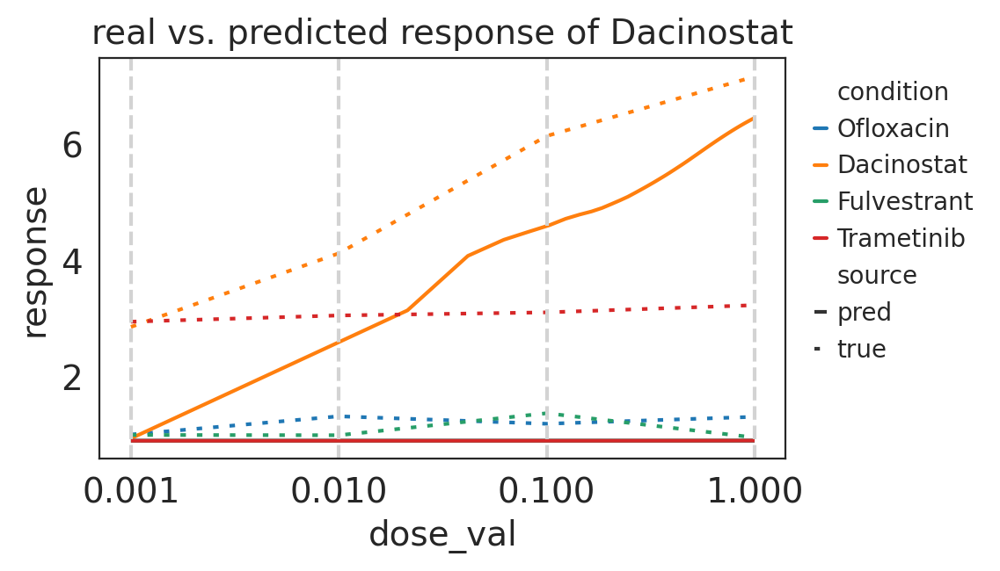

In [77]:
plt.figure(figsize=(5, 3))
data = pd.concat([reconstructed_response, df_reference])
sns.lineplot(
    data=data[data.cell_type == 'A549'],
    x='dose_val',
    y='response',
    hue='condition', 
    style='source', dashes=[(1, 0), (1.5, 3)])
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=10, frameon=False)

plt.xscale('log')
# floating point x-axis
from matplotlib.ticker import StrMethodFormatter
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.3f}')) # 2 decimal places

# lines for measured time
for val in df_reference.dose_val.unique():
    plt.axvline(val, color='lightgrey', linestyle='--')
plt.title('real vs. predicted response of Dacinostat')

## uncertainty for OOD predictions

In [68]:
import compert.plotting as pl

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/icb/yuge.ji/projects/test_AdvAE/compert/plotting.py:873: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1)


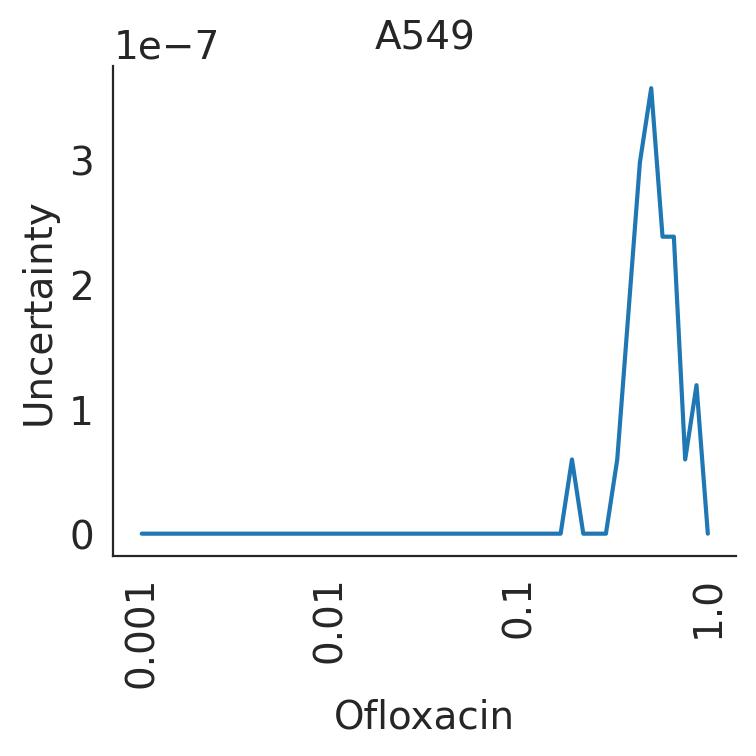

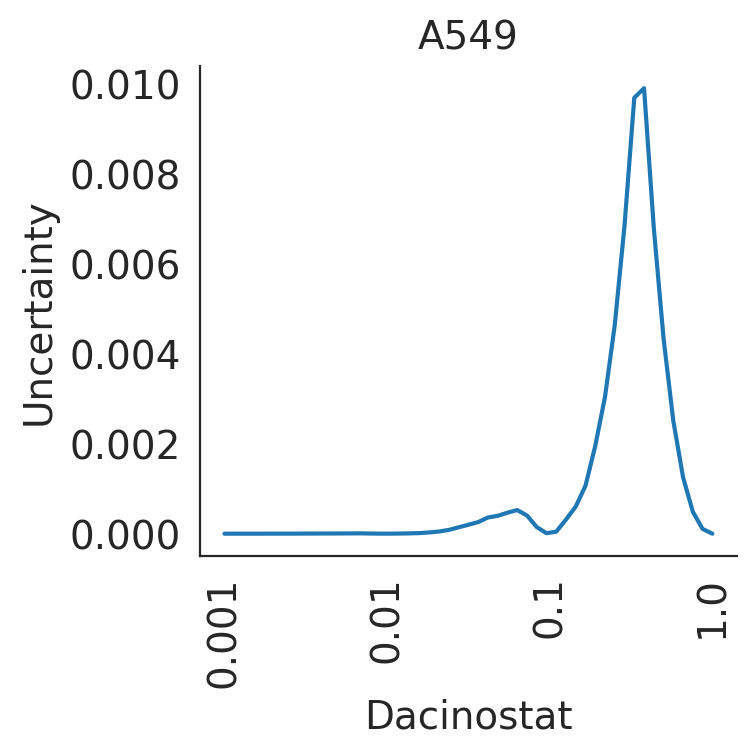

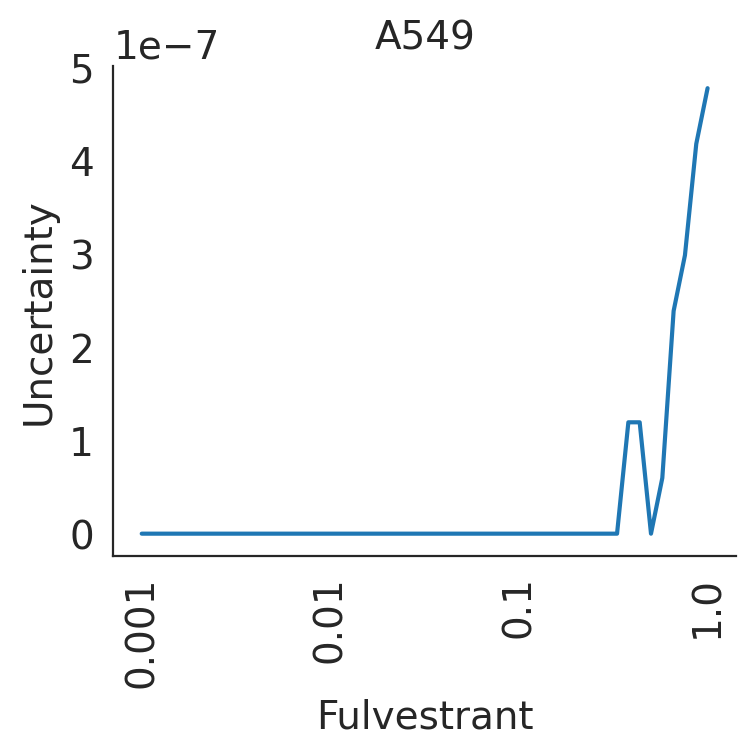

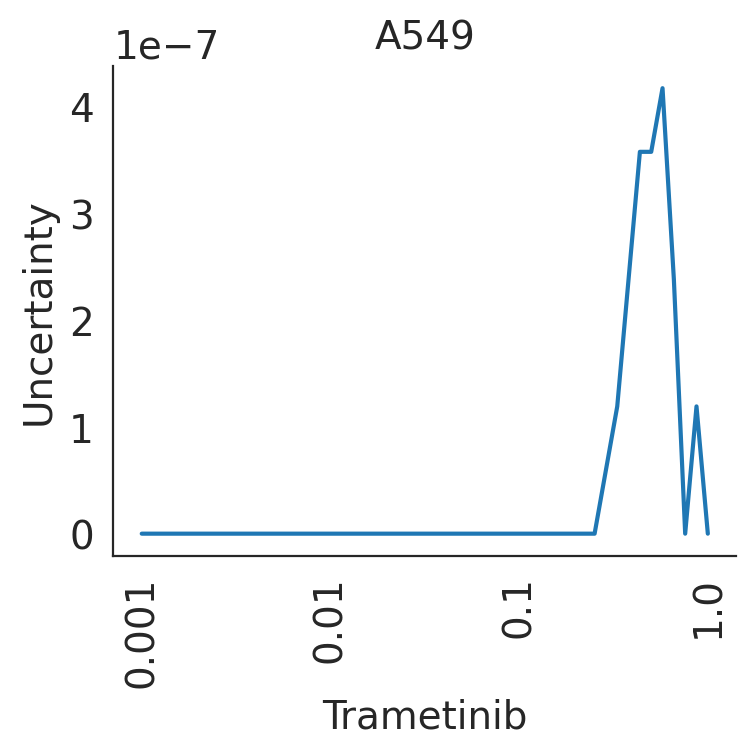

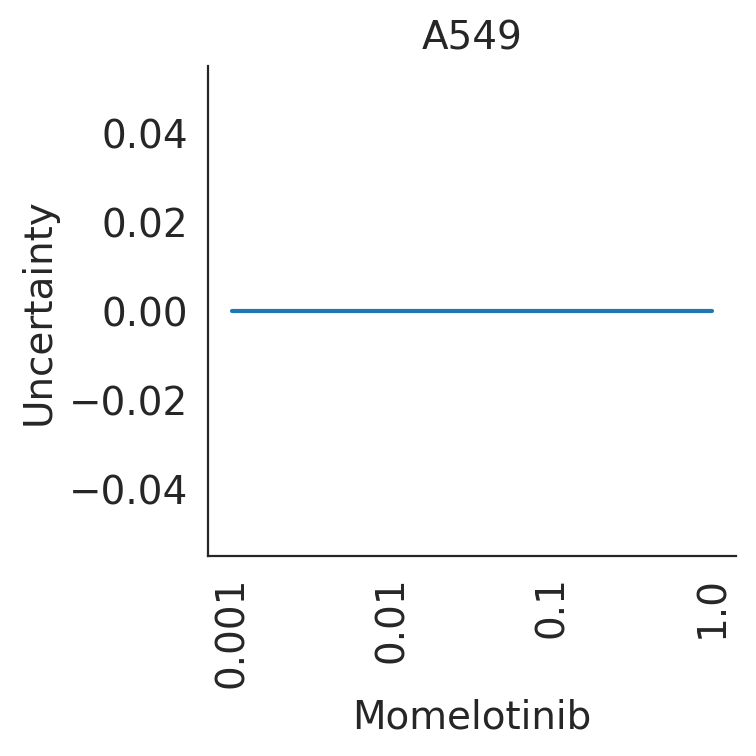

...

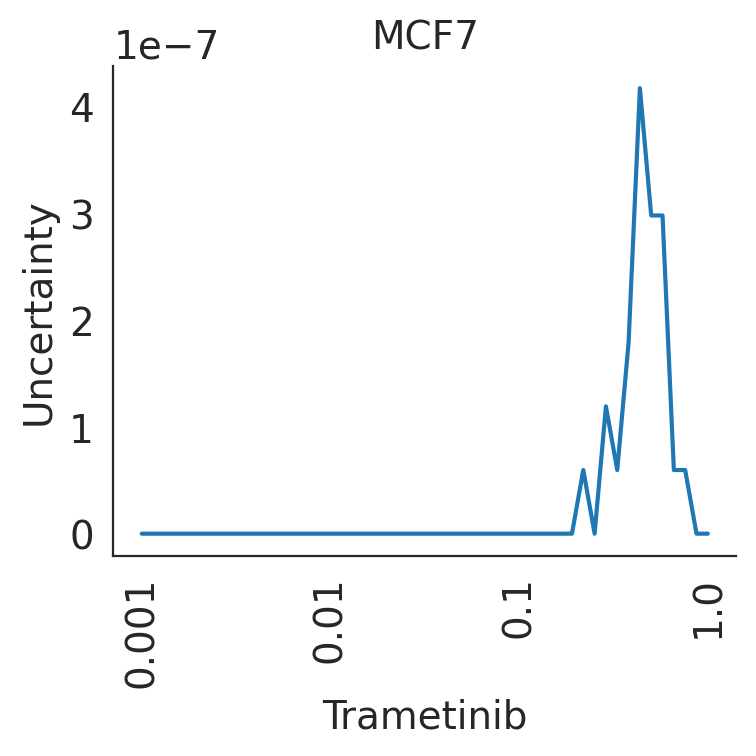

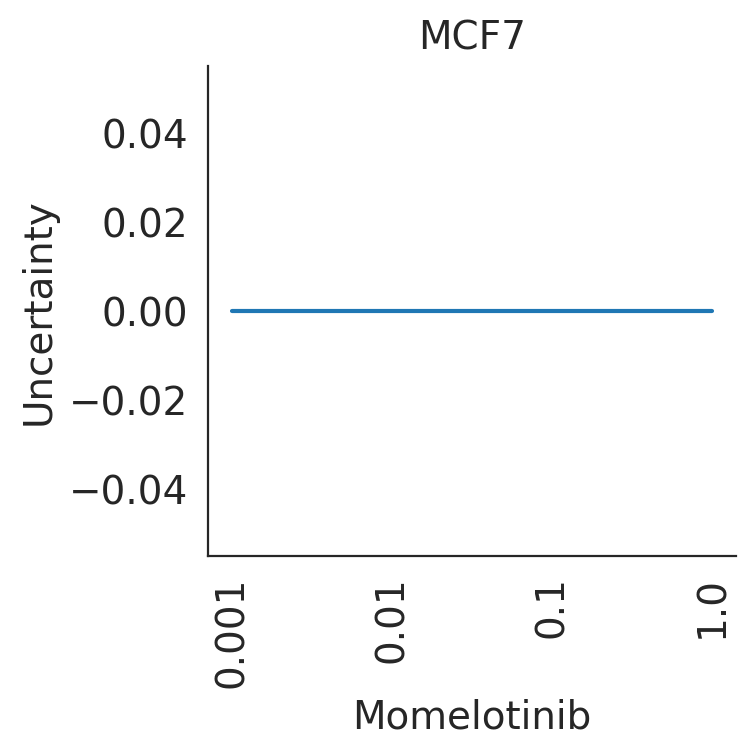

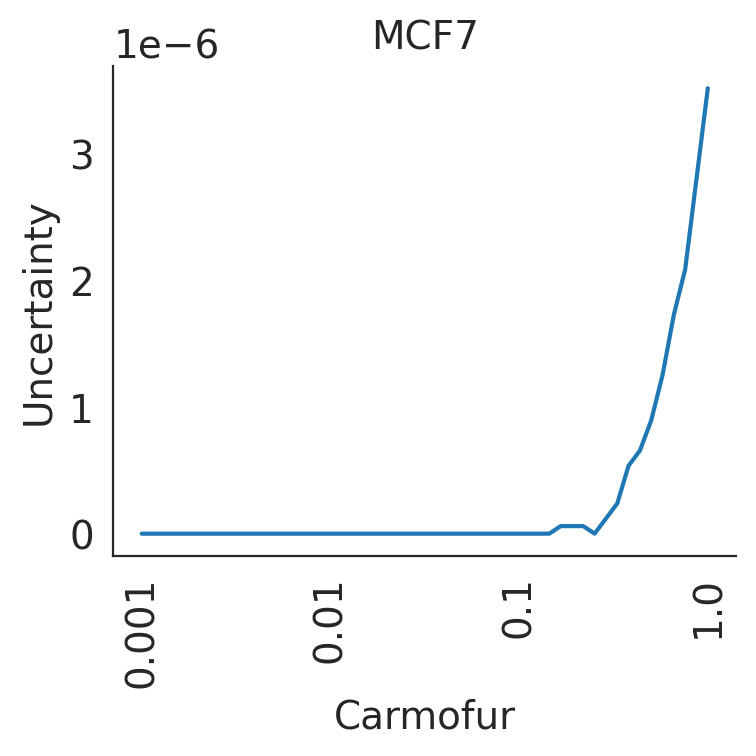

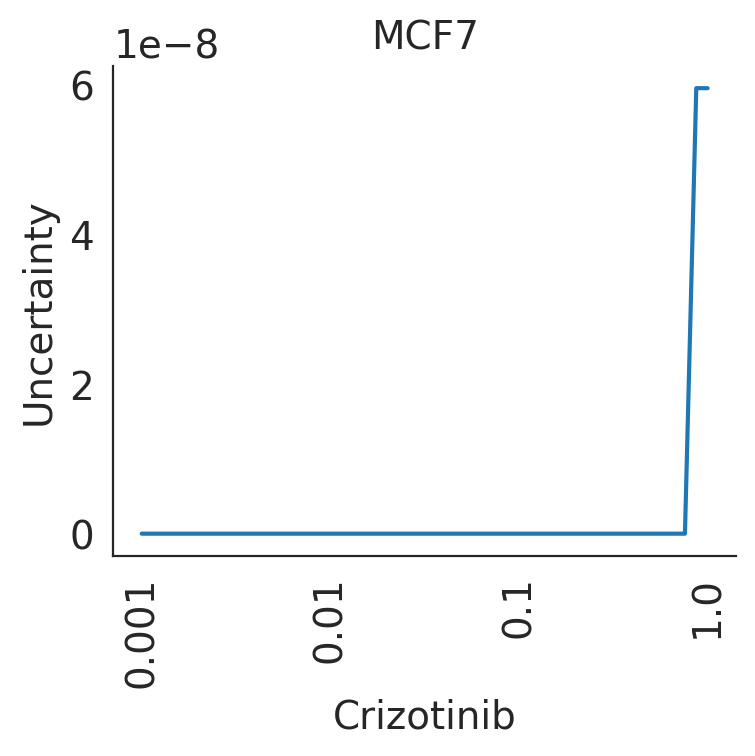

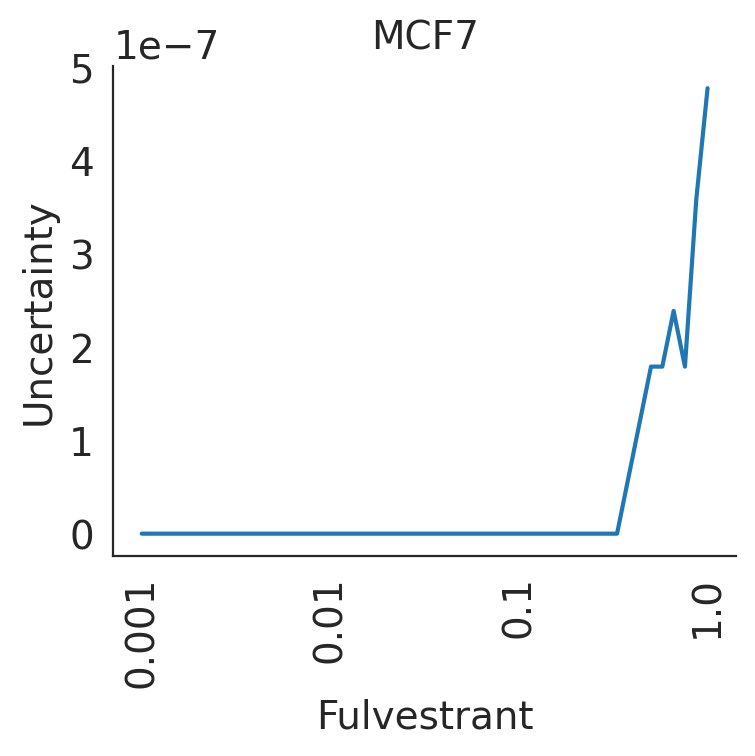

In [82]:
for ct in compert_api.unique_сovars:
    for pert in perts + list(pred.obs.condition.unique()):
        df_pred = pl.plot_uncertainty_dose(
            compert_api,
            cov=ct,
            pert=pert,
            N=51,
            measured_points=compert_api.measured_points['all'],
            cond_key='condition',
            log=True,
            metric='cosine'
        )